In [ ]:
#!git clone https://github.com/divamgupta/image-segmentation-keras
!git clone https://github.com/rajeevratan84/image-segmentation-keras.git

Cloning into 'image-segmentation-keras'...
remote: Enumerating objects: 1165, done.
remote: Total 1165 (delta 0), reused 0 (delta 0), pack-reused 1165
Receiving objects: 100% (1165/1165), 3.29 MiB | 19.25 MiB/s, done.
Resolving deltas: 100% (752/752), done.


In [ ]:
!pip install pkgconfig

In [ ]:
# !pip install h5py
!pip install Cython==0.29.36

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 35.0 MB/s eta 0:00:00
  Attempting uninstall: Cython
    Found existing installation: Cython 3.0.5
    Uninstalling Cython-3.0.5:
      Successfully uninstalled Cython-3.0.5


In [ ]:
%cd image-segmentation-keras
!python setup.py install

[Errno 2] No such file or directory: 'image-segmentation-keras'
/content/image-segmentation-keras
/usr/local/lib/python3.10/dist-packages/setuptools/dist.py:755: SetuptoolsDeprecationWarning: Invalid dash-separated options
!!

        ********************************************************************************
        Usage of dash-separated 'description-file' will not be supported in future
        versions. Please use the underscore name 'description_file' instead.

        This deprecation is overdue, please update your project and remove deprecated
        calls to avoid build errors in the future.

        See https://setuptools.pypa.io/en/latest/userguide/declarative_config.html for details.
        ********************************************************************************

!!
  opt = self.warn_dash_deprecation(opt, section)
running install
/usr/local/lib/python3.10/dist-packages/setuptools/_distutils/cmd.py:66: SetuptoolsDeprecationWarning: setup.py install is deprecat

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
working_directory = '/content/drive/MyDrive/DLproject'
original_img_dic = f'{working_directory}/original_images/'
# masked_img_dic = f'{working_directory}/RGB_color_image_masks/RGB_color_image_masks/'
masked_img_dic = f'{working_directory}/label_images_semantic/'

In [ ]:
# # final_h,final_w = 96,128
# # final_h,final_w = 512,512
# final_h,final_w = 384,512
# org_image_list = os.listdir(original_img_dic)
# masked_image_list = os.listdir(masked_img_dic)
# org_image_list = sorted([original_img_dic+i for i in org_image_list])
# masked_image_list = sorted([masked_img_dic+i for i in masked_image_list])

# train_org_image_list = org_image_list[:350]
# train_masked_image_list = masked_image_list[:350]

# test_org_image_list = org_image_list[350:400]
# test_masked_image_list = masked_image_list[350:400]
# # for i in range(len(train_org_image_list)):

#   #  print(train_org_image_list[i],train_masked_image_list[i])
# # x = np.random.randint((0,400))

# # n = 222
# # org_image = img.imread(train_org_image_list[n])
# # print(org_image.shape)
# # masked_image = img.imread(train_masked_image_list[n])
# # print(masked_image.shape)

# # fig ,arr  = plt.subplots(1,2,figsize=(15,10))
# # arr[0].imshow(org_image)
# # arr[0].set_title('Original Image')
# # arr[1].imshow(masked_image)
# # arr[1].set_title('Mask')
# # plt.show()

# # def resize(org_image,masked_image) :
# #     org_image = tf.image.resize(org_image,(512,512),method='nearest')
# #     masked_image = tf.image.resize(masked_image,(512,512),method='nearest')
# #     return org_image , masked_image

# # i,j = resize(org_image,masked_image)

# # print(i.shape)
# # # masked_image = img.imread(train_masked_image_list[n])
# # print(j.shape)

# # fig ,arr  = plt.subplots(1,2,figsize=(15,10))
# # arr[0].imshow(i)
# # arr[0].set_title('Original Image after resize')
# # arr[1].imshow(j)
# # arr[1].set_title('Masked image after resize')
# # plt.show()

In [ ]:
import pandas as pd
df = pd.read_csv(f'{working_directory}/class_dict_seg.csv')
df.head()

,name,r,g,b
0,unlabeled,0,0,0
1,paved-area,128,64,128
2,dirt,130,76,0
3,grass,0,102,0
4,gravel,112,103,87


In [ ]:
df.name

0       unlabeled
1      paved-area
2            dirt
3           grass
4          gravel
5           water
6           rocks
7            pool
8      vegetation
9            roof
10           wall
11         window
12           door
13          fence
14     fence-pole
15         person
16            dog
17            car
18        bicycle
19           tree
20      bald-tree
21      ar-marker
22       obstacle
23    conflicting
Name: name, dtype: object

In [ ]:
class_list = df.name.values.tolist()
print(class_list)
len(class_list)

['unlabeled', 'paved-area', 'dirt', 'grass', 'gravel', 'water', 'rocks', 'pool', 'vegetation', 'roof', 'wall', 'window', 'door', 'fence', 'fence-pole', 'person', 'dog', 'car', 'bicycle', 'tree', 'bald-tree', 'ar-marker', 'obstacle', 'conflicting']


24

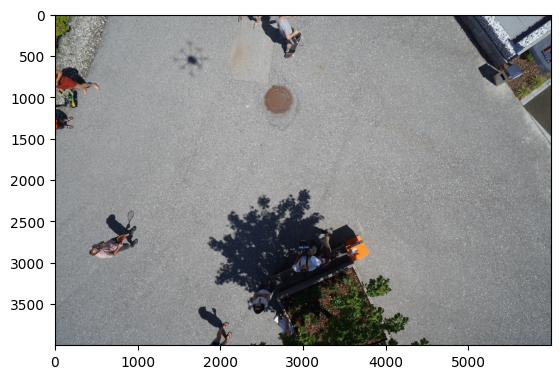

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
# original image
image = Image.open(f'{original_img_dic}/000.jpg')
image = np.array(image)
plt.imshow(image)

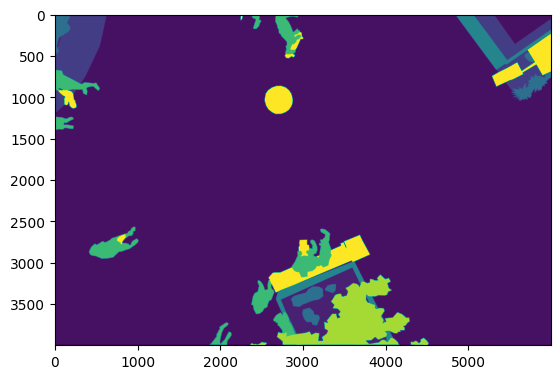

In [ ]:
# label image
label = Image.open(f'{masked_img_dic}/000.png')
label = np.array(label)
plt.imshow(label)

In [ ]:
image.shape, label.shape

((4000, 6000, 3), (4000, 6000))

In [ ]:
image.min(), image.max()

(0, 255)

In [ ]:
label.min(), label.max()

(0, 22)

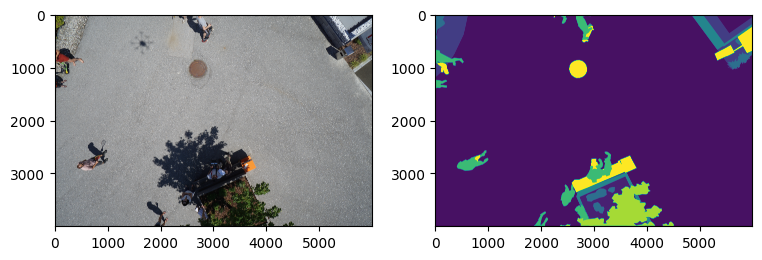

In [ ]:
plt.figure(figsize = (9, 4))

plt.subplot(1, 2, 1)
plt.imshow(image)

plt.subplot(1, 2, 2)
plt.imshow(label)

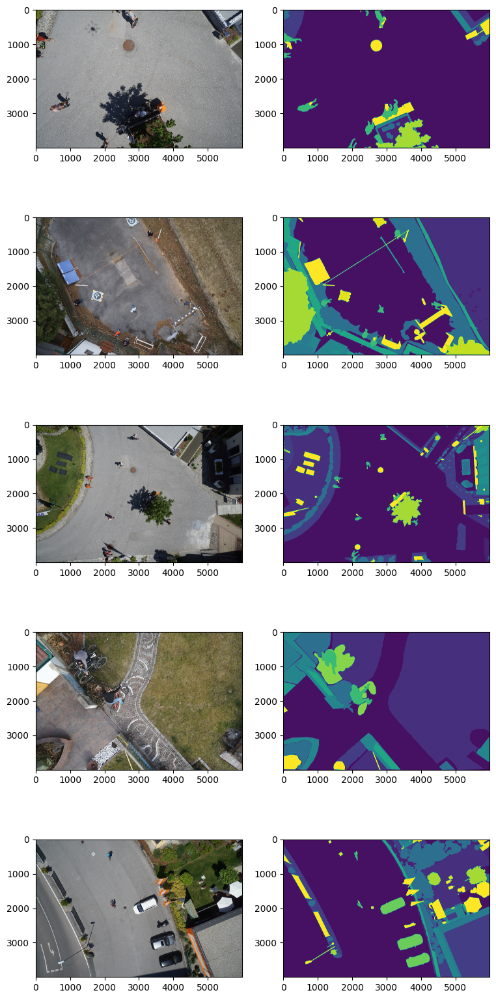

In [ ]:
# 5 pairs of original and label images
n_max_imgs = 5

plt.figure(figsize = (9, 20))
for n in range(n_max_imgs):

    image = Image.open(f'{original_img_dic}/00{n}.jpg')
    image = np.array(image)

    label = Image.open(f'{masked_img_dic}/00{n}.png')
    label = np.array(label)

    plt.subplot(n_max_imgs, 2, 2 * n + 1)
    plt.imshow(image)

    plt.subplot(n_max_imgs, 2, 2 * n + 2)
    plt.imshow(label)

In [ ]:
from glob import glob
images = sorted(glob(f'{original_img_dic}/*.jpg'))
#print(images)

In [ ]:
len(images)

400

In [ ]:
labels = sorted(glob(f'{masked_img_dic}/*.png'))
#print(labels)

In [ ]:
len(labels)

400

In [ ]:
from sklearn.model_selection import train_test_split
import os

# Define the paths to the image and annotation directories.
image_dir = original_img_dic
annotation_dir = masked_img_dic

# Get a list of all the image files.
image_files = os.listdir(image_dir)

# Split the data into a training set and a validation set.
train_files, val_files = train_test_split(image_files, test_size = 0.2, random_state = 42)

# Define the paths to the training and validation directories.
train_images = [os.path.join(image_dir, file) for file in train_files]
train_annotations = [os.path.join(annotation_dir, os.path.splitext(file)[0] + '.png') for file in train_files]
val_images = [os.path.join(image_dir, file) for file in val_files]
val_annotations = [os.path.join(annotation_dir, os.path.splitext(file)[0] + '.png') for file in val_files]

In [ ]:
import shutil

# Define the destination directory.
destination_dir = '/content/working/train_images'

# Create the destination directory if it doesn't exist.
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Copy the images to the destination directory.
for path in train_images:
    shutil.copy2(path, destination_dir)

In [ ]:
# Define the destination directory.
destination_dir = '/content/working/train_annotations'

# Create the destination directory if it doesn't exist.
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Copy the images to the destination directory.
for path in train_annotations:
    shutil.copy2(path, destination_dir)

In [ ]:
# Define the destination directory.
destination_dir = '/content/working/val_images'

# Create the destination directory if it doesn't exist.
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Copy the images to the destination directory.
for path in val_images:
    shutil.copy2(path, destination_dir)

In [ ]:
# Define the destination directory.
destination_dir = '/content/working/val_annotations'

# Create the destination directory if it doesn't exist.
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Copy the images to the destination directory.
for path in val_annotations:
    shutil.copy2(path, destination_dir)

In [ ]:
from keras_segmentation.models.segnet import segnet

model = segnet(n_classes = len(class_list), input_height = 384, input_width = 512)

In [ ]:
import tensorflow as tf

# Train the model using the training set and validate using the validation set
callback = tf.keras.callbacks.EarlyStopping(monitor = "val_loss", mode = "min", patience = 4)

model.train(train_images = '/content/working/train_images', train_annotations = '/content/working/train_annotations',
            val_images = '/content/working/val_images', val_annotations = '/content/working/val_annotations',
            checkpoints_path = '/tmp/vgg_unet_1', steps_per_epoch = 40, epochs = 100, callbacks = callback)

Verifying training dataset


100%|██████████| 320/320 [03:46<00:00,  1.41it/s]


Dataset verified! 
Epoch 1/100
40/40 [==============================] - ETA: 0s - loss: 2.3400 - accuracy: 0.4546

40/40 [==============================] - 69s 1s/step - loss: 2.3400 - accuracy: 0.4546
Epoch 2/100
40/40 [==============================] - ETA: 0s - loss: 2.0208 - accuracy: 0.5253

40/40 [==============================] - 59s 1s/step - loss: 2.0208 - accuracy: 0.5253
Epoch 3/100
40/40 [==============================] - ETA: 0s - loss: 2.3112 - accuracy: 0.4411

40/40 [==============================] - 57s 1s/step - loss: 2.3112 - accuracy: 0.4411
Epoch 4/100
40/40 [==============================] - ETA: 0s - loss: 1.9695 - accuracy: 0.4989

40/40 [==============================] - 59s 1s/step - loss: 1.9695 - accuracy: 0.4989
Epoch 5/100
40/40 [==============================] - ETA: 0s - loss: 1.6918 - accuracy: 0.5585

40/40 [==============================] - 57s 1s/step - loss: 1.6918 - accuracy: 0.5585
Epoch 6/100
40/40 [==============================] - ETA: 0s - loss: 1.6749 - accuracy: 0.5405

40/40 [==============================] - 59s 1s/step - loss: 1.6749 - accuracy: 0.5405
Epoch 7/100
40/40 [==============================] - ETA: 0s - loss: 1.8879 - accuracy: 0.4764

40/40 [==============================] - 57s 1s/step - loss: 1.8879 - accuracy: 0.4764
Epoch 8/100
40/40 [==============================] - ETA: 0s - loss: 1.6865 - accuracy: 0.5268

40/40 [==============================] - 59s 1s/step - loss: 1.6865 - accuracy: 0.5268
Epoch 9/100
40/40 [==============================] - ETA: 0s - loss: 1.4808 - accuracy: 0.5888

40/40 [==============================] - 57s 1s/step - loss: 1.4808 - accuracy: 0.5888
Epoch 10/100
40/40 [==============================] - ETA: 0s - loss: 1.4590 - accuracy: 0.5709

40/40 [==============================] - 59s 1s/step - loss: 1.4590 - accuracy: 0.5709
Epoch 11/100
40/40 [==============================] - ETA: 0s - loss: 1.7198 - accuracy: 0.4876

40/40 [==============================] - 57s 1s/step - loss: 1.7198 - accuracy: 0.4876
Epoch 12/100
40/40 [==============================] - ETA: 0s - loss: 1.5623 - accuracy: 0.5438

40/40 [==============================] - 59s 1s/step - loss: 1.5623 - accuracy: 0.5438
Epoch 13/100
40/40 [==============================] - ETA: 0s - loss: 1.4240 - accuracy: 0.5972

40/40 [==============================] - 56s 1s/step - loss: 1.4240 - accuracy: 0.5972
Epoch 14/100
40/40 [==============================] - ETA: 0s - loss: 1.3733 - accuracy: 0.5929

40/40 [==============================] - 58s 1s/step - loss: 1.3733 - accuracy: 0.5929
Epoch 15/100
40/40 [==============================] - ETA: 0s - loss: 1.6544 - accuracy: 0.5048

40/40 [==============================] - 58s 1s/step - loss: 1.6544 - accuracy: 0.5048
Epoch 16/100
40/40 [==============================] - ETA: 0s - loss: 1.4930 - accuracy: 0.5667

40/40 [==============================] - 61s 2s/step - loss: 1.4930 - accuracy: 0.5667
Epoch 17/100
40/40 [==============================] - ETA: 0s - loss: 1.3705 - accuracy: 0.6066

40/40 [==============================] - 60s 1s/step - loss: 1.3705 - accuracy: 0.6066
Epoch 18/100
40/40 [==============================] - ETA: 0s - loss: 1.3215 - accuracy: 0.6178

40/40 [==============================] - 59s 1s/step - loss: 1.3215 - accuracy: 0.6178
Epoch 19/100
40/40 [==============================] - ETA: 0s - loss: 1.5947 - accuracy: 0.5256

40/40 [==============================] - 56s 1s/step - loss: 1.5947 - accuracy: 0.5256
Epoch 20/100
40/40 [==============================] - ETA: 0s - loss: 1.4406 - accuracy: 0.5795

40/40 [==============================] - 58s 1s/step - loss: 1.4406 - accuracy: 0.5795
Epoch 21/100
40/40 [==============================] - ETA: 0s - loss: 1.3059 - accuracy: 0.6242

40/40 [==============================] - 59s 1s/step - loss: 1.3059 - accuracy: 0.6242
Epoch 22/100
40/40 [==============================] - ETA: 0s - loss: 1.2663 - accuracy: 0.6305

40/40 [==============================] - 59s 1s/step - loss: 1.2663 - accuracy: 0.6305
Epoch 23/100
40/40 [==============================] - ETA: 0s - loss: 1.5248 - accuracy: 0.5442

40/40 [==============================] - 57s 1s/step - loss: 1.5248 - accuracy: 0.5442
Epoch 24/100
40/40 [==============================] - ETA: 0s - loss: 1.4185 - accuracy: 0.5830

40/40 [==============================] - 58s 1s/step - loss: 1.4185 - accuracy: 0.5830
Epoch 25/100
40/40 [==============================] - ETA: 0s - loss: 1.2691 - accuracy: 0.6350

40/40 [==============================] - 57s 1s/step - loss: 1.2691 - accuracy: 0.6350
Epoch 26/100
40/40 [==============================] - ETA: 0s - loss: 1.2434 - accuracy: 0.6351

40/40 [==============================] - 57s 1s/step - loss: 1.2434 - accuracy: 0.6351
Epoch 27/100
40/40 [==============================] - ETA: 0s - loss: 1.4700 - accuracy: 0.5650

40/40 [==============================] - 58s 1s/step - loss: 1.4700 - accuracy: 0.5650
Epoch 28/100
40/40 [==============================] - ETA: 0s - loss: 1.3759 - accuracy: 0.5949

40/40 [==============================] - 55s 1s/step - loss: 1.3759 - accuracy: 0.5949
Epoch 29/100
40/40 [==============================] - ETA: 0s - loss: 1.2167 - accuracy: 0.6493

40/40 [==============================] - 57s 1s/step - loss: 1.2167 - accuracy: 0.6493
Epoch 30/100
40/40 [==============================] - ETA: 0s - loss: 1.1988 - accuracy: 0.6459

40/40 [==============================] - 55s 1s/step - loss: 1.1988 - accuracy: 0.6459
Epoch 31/100
40/40 [==============================] - ETA: 0s - loss: 1.4087 - accuracy: 0.5838

40/40 [==============================] - 57s 1s/step - loss: 1.4087 - accuracy: 0.5838
Epoch 32/100
40/40 [==============================] - ETA: 0s - loss: 1.3447 - accuracy: 0.6047

40/40 [==============================] - 56s 1s/step - loss: 1.3447 - accuracy: 0.6047
Epoch 33/100
40/40 [==============================] - ETA: 0s - loss: 1.1709 - accuracy: 0.6567

40/40 [==============================] - 56s 1s/step - loss: 1.1709 - accuracy: 0.6567
Epoch 34/100
40/40 [==============================] - ETA: 0s - loss: 1.1623 - accuracy: 0.6557

40/40 [==============================] - 58s 1s/step - loss: 1.1623 - accuracy: 0.6557
Epoch 35/100
40/40 [==============================] - ETA: 0s - loss: 1.3504 - accuracy: 0.6015

40/40 [==============================] - 56s 1s/step - loss: 1.3504 - accuracy: 0.6015
Epoch 36/100
40/40 [==============================] - ETA: 0s - loss: 1.3271 - accuracy: 0.6116

40/40 [==============================] - 58s 1s/step - loss: 1.3271 - accuracy: 0.6116
Epoch 37/100
40/40 [==============================] - ETA: 0s - loss: 1.1444 - accuracy: 0.6663

40/40 [==============================] - 55s 1s/step - loss: 1.1444 - accuracy: 0.6663
Epoch 38/100
40/40 [==============================] - ETA: 0s - loss: 1.1427 - accuracy: 0.6570

40/40 [==============================] - 56s 1s/step - loss: 1.1427 - accuracy: 0.6570
Epoch 39/100
40/40 [==============================] - ETA: 0s - loss: 1.3153 - accuracy: 0.6118

40/40 [==============================] - 57s 1s/step - loss: 1.3153 - accuracy: 0.6118
Epoch 40/100
40/40 [==============================] - ETA: 0s - loss: 1.2871 - accuracy: 0.6253

40/40 [==============================] - 56s 1s/step - loss: 1.2871 - accuracy: 0.6253
Epoch 41/100
40/40 [==============================] - ETA: 0s - loss: 1.1266 - accuracy: 0.6678

40/40 [==============================] - 58s 1s/step - loss: 1.1266 - accuracy: 0.6678
Epoch 42/100
40/40 [==============================] - ETA: 0s - loss: 1.1181 - accuracy: 0.6625

40/40 [==============================] - 55s 1s/step - loss: 1.1181 - accuracy: 0.6625
Epoch 43/100
40/40 [==============================] - ETA: 0s - loss: 1.2578 - accuracy: 0.6315

40/40 [==============================] - 56s 1s/step - loss: 1.2578 - accuracy: 0.6315
Epoch 44/100
40/40 [==============================] - ETA: 0s - loss: 1.2294 - accuracy: 0.6388

40/40 [==============================] - 57s 1s/step - loss: 1.2294 - accuracy: 0.6388
Epoch 45/100
40/40 [==============================] - ETA: 0s - loss: 1.0620 - accuracy: 0.6904

40/40 [==============================] - 55s 1s/step - loss: 1.0620 - accuracy: 0.6904
Epoch 46/100
40/40 [==============================] - ETA: 0s - loss: 1.0644 - accuracy: 0.6807

40/40 [==============================] - 57s 1s/step - loss: 1.0644 - accuracy: 0.6807
Epoch 47/100
40/40 [==============================] - ETA: 0s - loss: 1.2244 - accuracy: 0.6385

40/40 [==============================] - 55s 1s/step - loss: 1.2244 - accuracy: 0.6385
Epoch 48/100
40/40 [==============================] - ETA: 0s - loss: 1.1952 - accuracy: 0.6478

40/40 [==============================] - 56s 1s/step - loss: 1.1952 - accuracy: 0.6478
Epoch 49/100
40/40 [==============================] - ETA: 0s - loss: 1.0273 - accuracy: 0.6984

40/40 [==============================] - 57s 1s/step - loss: 1.0273 - accuracy: 0.6984
Epoch 50/100
40/40 [==============================] - ETA: 0s - loss: 1.0244 - accuracy: 0.6913

40/40 [==============================] - 55s 1s/step - loss: 1.0244 - accuracy: 0.6913
Epoch 51/100
40/40 [==============================] - ETA: 0s - loss: 1.1708 - accuracy: 0.6540

40/40 [==============================] - 57s 1s/step - loss: 1.1708 - accuracy: 0.6540
Epoch 52/100
40/40 [==============================] - ETA: 0s - loss: 1.1649 - accuracy: 0.6499

40/40 [==============================] - 55s 1s/step - loss: 1.1649 - accuracy: 0.6499
Epoch 53/100
40/40 [==============================] - ETA: 0s - loss: 1.0011 - accuracy: 0.7062

40/40 [==============================] - 54s 1s/step - loss: 1.0011 - accuracy: 0.7062
Epoch 54/100
40/40 [==============================] - ETA: 0s - loss: 1.0033 - accuracy: 0.6973

40/40 [==============================] - 56s 1s/step - loss: 1.0033 - accuracy: 0.6973
Epoch 55/100
40/40 [==============================] - ETA: 0s - loss: 1.1295 - accuracy: 0.6667

40/40 [==============================] - 54s 1s/step - loss: 1.1295 - accuracy: 0.6667
Epoch 56/100
40/40 [==============================] - ETA: 0s - loss: 1.1463 - accuracy: 0.6546

40/40 [==============================] - 55s 1s/step - loss: 1.1463 - accuracy: 0.6546
Epoch 57/100
40/40 [==============================] - ETA: 0s - loss: 0.9760 - accuracy: 0.7125

40/40 [==============================] - 56s 1s/step - loss: 0.9760 - accuracy: 0.7125
Epoch 58/100
40/40 [==============================] - ETA: 0s - loss: 0.9925 - accuracy: 0.6982

40/40 [==============================] - 54s 1s/step - loss: 0.9925 - accuracy: 0.6982
Epoch 59/100
40/40 [==============================] - ETA: 0s - loss: 1.1427 - accuracy: 0.6667

40/40 [==============================] - 56s 1s/step - loss: 1.1427 - accuracy: 0.6667
Epoch 60/100
40/40 [==============================] - ETA: 0s - loss: 1.1043 - accuracy: 0.6695

40/40 [==============================] - 58s 1s/step - loss: 1.1043 - accuracy: 0.6695
Epoch 61/100
40/40 [==============================] - ETA: 0s - loss: 0.9423 - accuracy: 0.7233

40/40 [==============================] - 56s 1s/step - loss: 0.9423 - accuracy: 0.7233
Epoch 62/100
40/40 [==============================] - ETA: 0s - loss: 0.9516 - accuracy: 0.7080

40/40 [==============================] - 58s 1s/step - loss: 0.9516 - accuracy: 0.7080
Epoch 63/100
40/40 [==============================] - ETA: 0s - loss: 1.1084 - accuracy: 0.6788

40/40 [==============================] - 56s 1s/step - loss: 1.1084 - accuracy: 0.6788
Epoch 64/100
40/40 [==============================] - ETA: 0s - loss: 1.0527 - accuracy: 0.6866

40/40 [==============================] - 58s 1s/step - loss: 1.0527 - accuracy: 0.6866
Epoch 65/100
40/40 [==============================] - ETA: 0s - loss: 0.9146 - accuracy: 0.7309

40/40 [==============================] - 56s 1s/step - loss: 0.9146 - accuracy: 0.7309
Epoch 66/100
40/40 [==============================] - ETA: 0s - loss: 0.9158 - accuracy: 0.7195

40/40 [==============================] - 58s 1s/step - loss: 0.9158 - accuracy: 0.7195
Epoch 67/100
40/40 [==============================] - ETA: 0s - loss: 1.0451 - accuracy: 0.6973

40/40 [==============================] - 58s 1s/step - loss: 1.0451 - accuracy: 0.6973
Epoch 68/100
40/40 [==============================] - ETA: 0s - loss: 1.0063 - accuracy: 0.7006

40/40 [==============================] - 57s 1s/step - loss: 1.0063 - accuracy: 0.7006
Epoch 69/100
40/40 [==============================] - ETA: 0s - loss: 0.8827 - accuracy: 0.7370

40/40 [==============================] - 59s 1s/step - loss: 0.8827 - accuracy: 0.7370
Epoch 70/100
40/40 [==============================] - ETA: 0s - loss: 0.9070 - accuracy: 0.7216

40/40 [==============================] - 57s 1s/step - loss: 0.9070 - accuracy: 0.7216
Epoch 71/100
40/40 [==============================] - ETA: 0s - loss: 1.0090 - accuracy: 0.7091

40/40 [==============================] - 60s 2s/step - loss: 1.0090 - accuracy: 0.7091
Epoch 72/100
40/40 [==============================] - ETA: 0s - loss: 0.9682 - accuracy: 0.7149

40/40 [==============================] - 57s 1s/step - loss: 0.9682 - accuracy: 0.7149
Epoch 73/100
40/40 [==============================] - ETA: 0s - loss: 0.8785 - accuracy: 0.7359

40/40 [==============================] - 58s 1s/step - loss: 0.8785 - accuracy: 0.7359
Epoch 74/100
40/40 [==============================] - ETA: 0s - loss: 0.8773 - accuracy: 0.7303

40/40 [==============================] - 57s 1s/step - loss: 0.8773 - accuracy: 0.7303
Epoch 75/100
40/40 [==============================] - ETA: 0s - loss: 0.9854 - accuracy: 0.7121

40/40 [==============================] - 57s 1s/step - loss: 0.9854 - accuracy: 0.7121
Epoch 76/100
40/40 [==============================] - ETA: 0s - loss: 0.9469 - accuracy: 0.7197

40/40 [==============================] - 58s 1s/step - loss: 0.9469 - accuracy: 0.7197
Epoch 77/100
40/40 [==============================] - ETA: 0s - loss: 0.8706 - accuracy: 0.7403

40/40 [==============================] - 57s 1s/step - loss: 0.8706 - accuracy: 0.7403
Epoch 78/100
40/40 [==============================] - ETA: 0s - loss: 0.8721 - accuracy: 0.7339

40/40 [==============================] - 58s 1s/step - loss: 0.8721 - accuracy: 0.7339
Epoch 79/100
40/40 [==============================] - ETA: 0s - loss: 0.9574 - accuracy: 0.7169

40/40 [==============================] - 55s 1s/step - loss: 0.9574 - accuracy: 0.7169
Epoch 80/100
40/40 [==============================] - ETA: 0s - loss: 0.9225 - accuracy: 0.7241

40/40 [==============================] - 55s 1s/step - loss: 0.9225 - accuracy: 0.7241
Epoch 81/100
40/40 [==============================] - ETA: 0s - loss: 0.8629 - accuracy: 0.7421

40/40 [==============================] - 57s 1s/step - loss: 0.8629 - accuracy: 0.7421
Epoch 82/100
40/40 [==============================] - ETA: 0s - loss: 0.8314 - accuracy: 0.7544

40/40 [==============================] - 55s 1s/step - loss: 0.8314 - accuracy: 0.7544
Epoch 83/100
40/40 [==============================] - ETA: 0s - loss: 0.9324 - accuracy: 0.7225

40/40 [==============================] - 56s 1s/step - loss: 0.9324 - accuracy: 0.7225
Epoch 84/100
40/40 [==============================] - ETA: 0s - loss: 0.8924 - accuracy: 0.7335

40/40 [==============================] - 56s 1s/step - loss: 0.8924 - accuracy: 0.7335
Epoch 85/100
40/40 [==============================] - ETA: 0s - loss: 0.8029 - accuracy: 0.7620

40/40 [==============================] - 55s 1s/step - loss: 0.8029 - accuracy: 0.7620
Epoch 86/100
40/40 [==============================] - ETA: 0s - loss: 0.7914 - accuracy: 0.7647

40/40 [==============================] - 57s 1s/step - loss: 0.7914 - accuracy: 0.7647
Epoch 87/100
40/40 [==============================] - ETA: 0s - loss: 0.8941 - accuracy: 0.7367

40/40 [==============================] - 55s 1s/step - loss: 0.8941 - accuracy: 0.7367
Epoch 88/100
40/40 [==============================] - ETA: 0s - loss: 0.8525 - accuracy: 0.7486

40/40 [==============================] - 55s 1s/step - loss: 0.8525 - accuracy: 0.7486
Epoch 89/100
40/40 [==============================] - ETA: 0s - loss: 0.7775 - accuracy: 0.7696

40/40 [==============================] - 57s 1s/step - loss: 0.7775 - accuracy: 0.7696
Epoch 90/100
40/40 [==============================] - ETA: 0s - loss: 0.7657 - accuracy: 0.7743

40/40 [==============================] - 55s 1s/step - loss: 0.7657 - accuracy: 0.7743
Epoch 91/100
40/40 [==============================] - ETA: 0s - loss: 0.8736 - accuracy: 0.7459

40/40 [==============================] - 56s 1s/step - loss: 0.8736 - accuracy: 0.7459
Epoch 92/100
40/40 [==============================] - ETA: 0s - loss: 0.8345 - accuracy: 0.7541

40/40 [==============================] - 55s 1s/step - loss: 0.8345 - accuracy: 0.7541
Epoch 93/100
40/40 [==============================] - ETA: 0s - loss: 0.7387 - accuracy: 0.7834

40/40 [==============================] - 55s 1s/step - loss: 0.7387 - accuracy: 0.7834
Epoch 94/100
40/40 [==============================] - ETA: 0s - loss: 0.7294 - accuracy: 0.7863

40/40 [==============================] - 57s 1s/step - loss: 0.7294 - accuracy: 0.7863
Epoch 95/100
40/40 [==============================] - ETA: 0s - loss: 0.8400 - accuracy: 0.7577

40/40 [==============================] - 55s 1s/step - loss: 0.8400 - accuracy: 0.7577
Epoch 96/100
40/40 [==============================] - ETA: 0s - loss: 0.8255 - accuracy: 0.7567

40/40 [==============================] - 55s 1s/step - loss: 0.8255 - accuracy: 0.7567
Epoch 97/100
40/40 [==============================] - ETA: 0s - loss: 0.7132 - accuracy: 0.7908

40/40 [==============================] - 56s 1s/step - loss: 0.7132 - accuracy: 0.7908
Epoch 98/100
40/40 [==============================] - ETA: 0s - loss: 0.7053 - accuracy: 0.7952

40/40 [==============================] - 55s 1s/step - loss: 0.7053 - accuracy: 0.7952
Epoch 99/100
40/40 [==============================] - ETA: 0s - loss: 0.7972 - accuracy: 0.7688

40/40 [==============================] - 57s 1s/step - loss: 0.7972 - accuracy: 0.7688
Epoch 100/100
40/40 [==============================] - ETA: 0s - loss: 0.7944 - accuracy: 0.7644

40/40 [==============================] - 55s 1s/step - loss: 0.7944 - accuracy: 0.7644


In [ ]:
model.save('semantic_segmentation_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
pred = model.predict_segmentation(
    inp = val_images[0],
    out_fname = '/tmp/pred.jpg')

1/1 [==============================] - 1s 1s/step


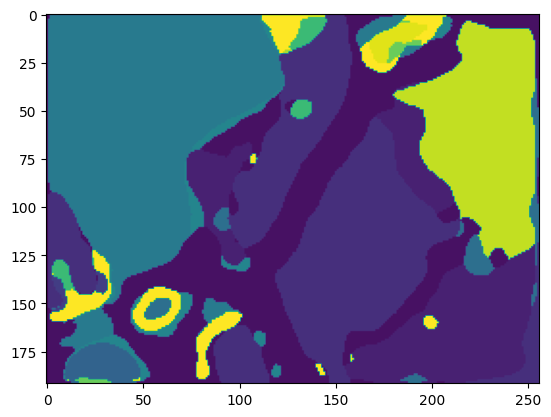

In [ ]:
plt.imshow(pred)

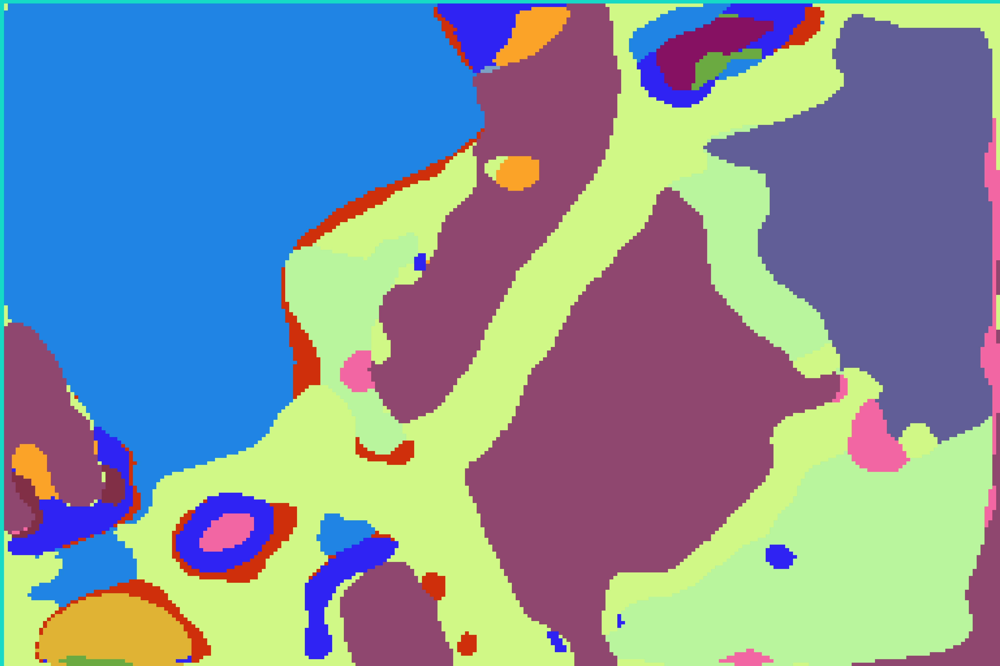

In [ ]:
from IPython.display import Image
Image('/tmp/pred.jpg')

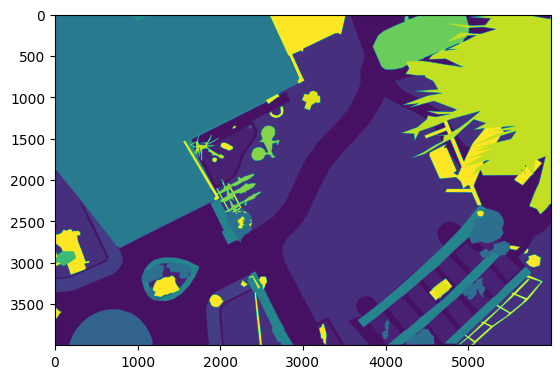

In [ ]:
from PIL import Image
truth = Image.open(val_annotations[0])
truth = np.array(truth)
plt.imshow(truth)

In [ ]:
pred_legend = model.predict_segmentation(
    inp = val_images[0],
    out_fname = '/tmp/pred.jpg' , overlay_img = True, show_legends = True,
    class_names = class_list)

1/1 [==============================] - 0s 28ms/step


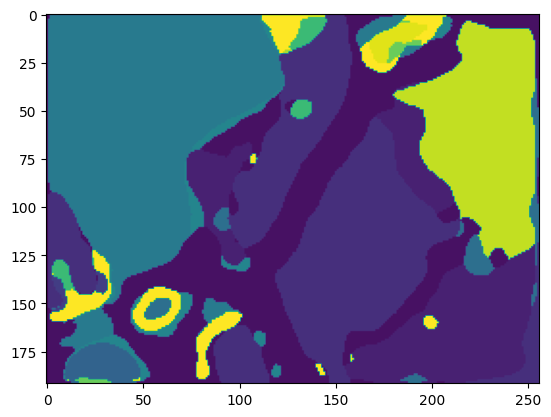

In [ ]:
plt.imshow(pred_legend)

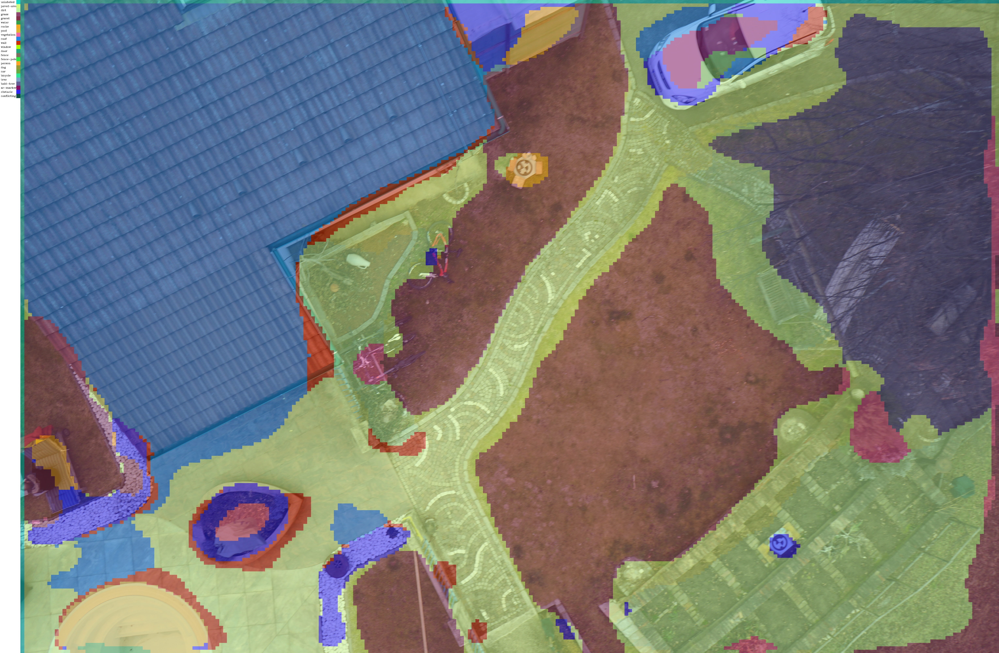

In [ ]:
from IPython.display import Image
Image('/tmp/pred.jpg')

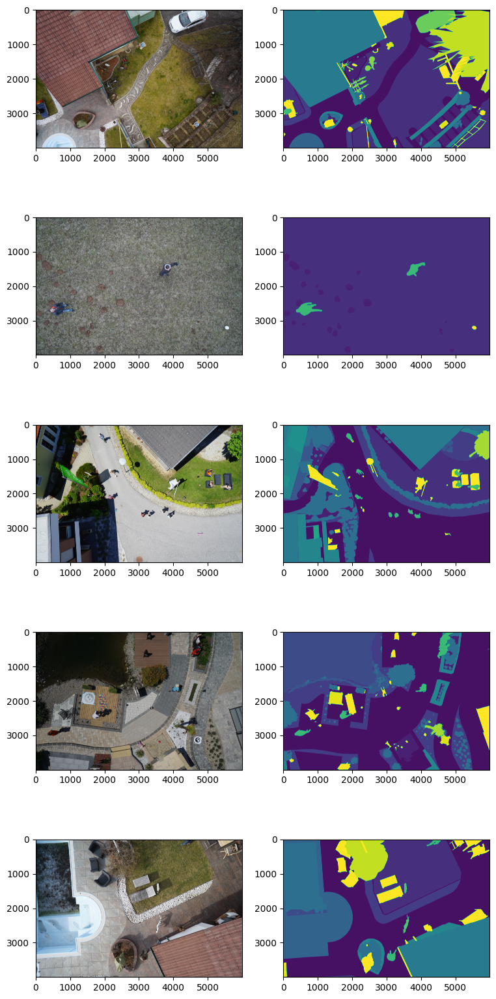

In [ ]:
# 5 pairs of original and label images from the validation data
from PIL import Image
n_max_imgs = 5

plt.figure(figsize = (9, 20))
for n in range(n_max_imgs):

    image = Image.open(val_images[n])
    image = np.array(image)

    label = Image.open(val_annotations[n])
    label = np.array(label)

    plt.subplot(n_max_imgs, 2, 2 * n + 1)
    plt.imshow(image)

    plt.subplot(n_max_imgs, 2, 2 * n + 2)
    plt.imshow(label)

1/1 [==============================] - 0s 38ms/step


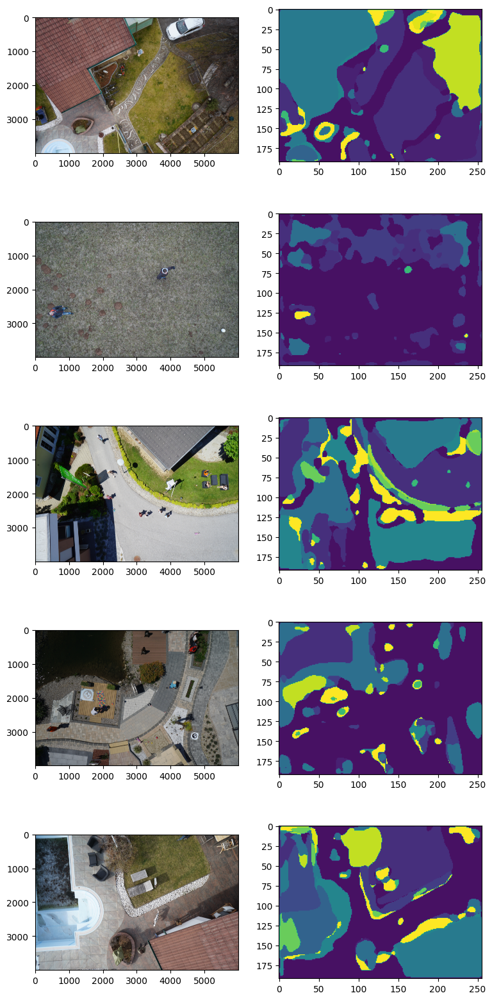

In [ ]:
# 5 pairs of original and predicted images from the validation data
n_max_imgs = 5

plt.figure(figsize = (9, 20))
for n in range(n_max_imgs):

    image = Image.open(val_images[n])
    image = np.array(image)

    label = model.predict_segmentation(
            inp = val_images[n],
            out_fname = '/tmp/pred.jpg', overlay_img = True, show_legends = True,
            class_names = class_list)

    plt.subplot(n_max_imgs, 2, 2 * n + 1)
    plt.imshow(image)

    plt.subplot(n_max_imgs, 2, 2 * n + 2)
    plt.imshow(label)

In [ ]:
model.save(f'{working_directory}/segnet512', 'segnet_512')